Image     Nearest-Neighbor              Bilinear Interpolation        
01          31.284316486625514            39.257033179012346            
02          11.902013310185184            16.21177662037037             
03          -1                            -1                            
04          78.73781724215534             81.65874063625257             
05          50.57724609375                53.70764858217593             
06          30.553995949074075            35.51769129372428             
07          27.964142659505207            30.22005997721354             
08          -1                            -1                            
09          21.148100694444445            26.669085590277778            
10          -1                            -1                            
11          -1                            -1                            


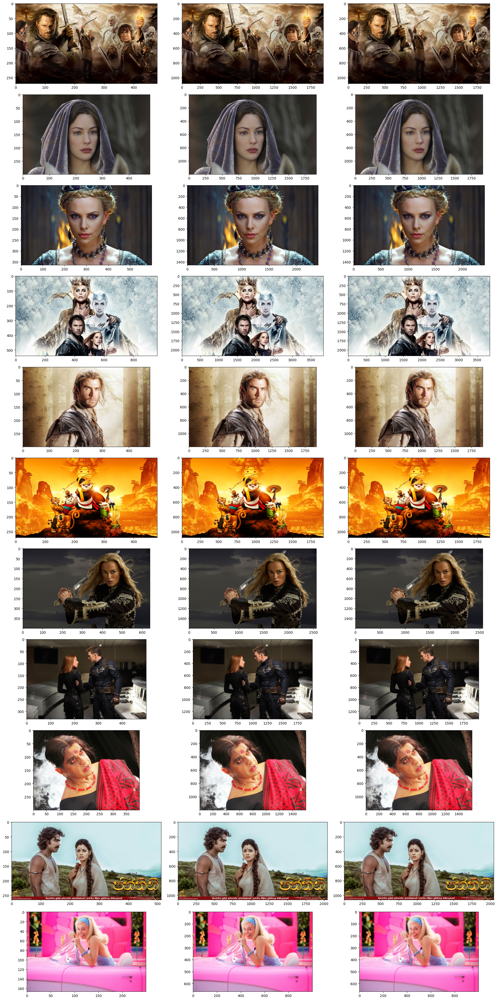

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def nearest_neighbor(img, zoom_factor):
    height, width = img.shape[:2]
    new_height = int(height * zoom_factor)
    new_width = int(width * zoom_factor)
    zoomed_image = np.zeros((new_height, new_width, 3), dtype=np.uint8)
    for i in range(new_height):
        for j in range(new_width):
            zoomed_image[i, j] = img[int(i / zoom_factor), int(j / zoom_factor)]
    return zoomed_image
def bilinear_interpolation(img, zoom_factor):
    height, width = img.shape[:2]
    new_height = int(height * zoom_factor)
    new_width = int(width * zoom_factor)
    zoomed_image = np.zeros((new_height, new_width, 3), dtype=np.uint8)
    for i in range(new_height):
        for j in range(new_width):
            y = i / zoom_factor
            x = j / zoom_factor
            i1, j1 = int(y), int(x)
            i2, j2 = min(i1 + 1, height - 1), min(j1 + 1, width - 1)
            alpha = y - i1
            beta = x - j1
            pixel = ((1 - alpha) * (1 - beta) * img[i1, j1] + alpha * (1 - beta) * img[i2, j1] +
                    (1 - alpha) * beta * img[i1, j2] + alpha * beta * img[i2, j2])
            zoomed_image[i, j] = pixel.astype(np.uint8)
    return zoomed_image

def normalized_ssd(original, scaled):
    if original.shape == scaled.shape:
        return np.sum((original - scaled) ** 2) / original.size
    else:
        return -1

zoom_factor = 4.0  # Change this to your desired zoom factor

print(f'{"Image":<10}{"Nearest-Neighbor":<30}{"Bilinear Interpolation":<30}')

fig, axes = plt.subplots(11, 3, figsize=(20, 40))

for i in range(11):
    path = f'zooming/im{i+1:02}small.png'
    img2scale = cv2.imread(path)
    axes[i, 0].imshow(cv2.cvtColor(img2scale, cv2.COLOR_BGR2RGB))   
    path2 = f'zooming/im{i+1:02}.png'
    original = cv2.imread(path2)


    nn_zoomed_image = nearest_neighbor(img2scale, zoom_factor)
    original_resized = cv2.resize(original, nn_zoomed_image.shape[:2][::-1])

    ssd4nn = normalized_ssd(original, nn_zoomed_image)
    axes[i, 1].imshow(cv2.cvtColor(nn_zoomed_image, cv2.COLOR_BGR2RGB))

    bilinear_zoomed_image = bilinear_interpolation(img2scale, zoom_factor)
    original_resized = cv2.resize(original, bilinear_zoomed_image.shape[:2][::-1])

    ssd4bi = normalized_ssd(original, bilinear_zoomed_image)
    axes[i, 2].imshow(cv2.cvtColor(bilinear_zoomed_image, cv2.COLOR_BGR2RGB))

    print(f'{i+1:02}{"":<10}{ssd4nn:<30}{ssd4bi:<30}')

plt.tight_layout()
plt.show()
